# Item 9

Tomar fotografías donde coexistan varios objetos en posiciones solapadas y no, en contextos de diferente complejidad. Luego, aplicar los algoritmos de segmentación propuestos y verificar los resultados de cada uno. Comentar qué diferencias observa. 

### Importar las librerías necesarias y definición del path de video base

In [3]:
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms as T
import torchvision
import numpy as np
import cv2
import matplotlib.image as mpimg
import random


### Visualización de las imágenes

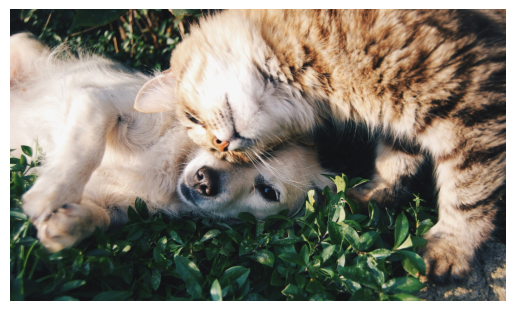

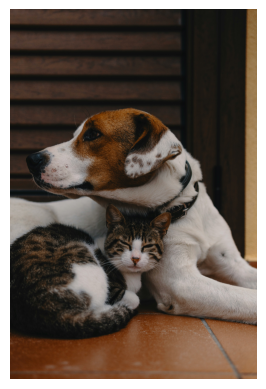

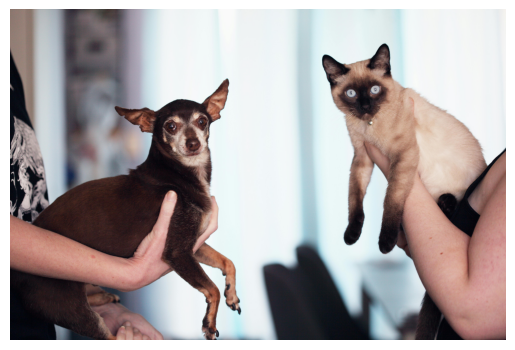

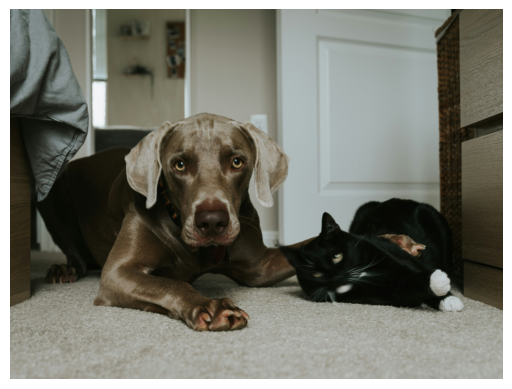

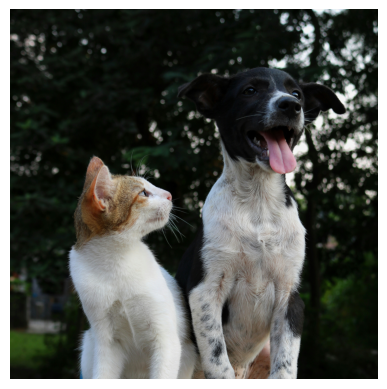

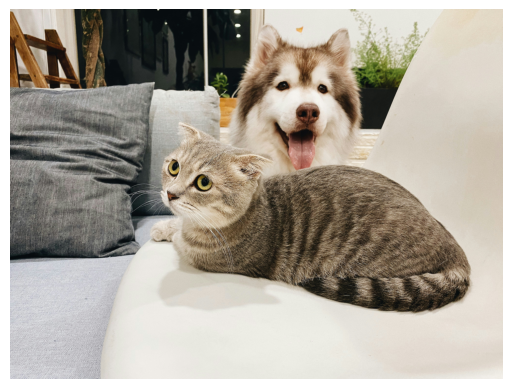

In [4]:
# Prueba con una imagen local
img_paths = ['cats-and-dogs.jpg', 'cats-and-dogs2.jpg', 'cats-and-dogs3.jpg', 
             'cats-and-dogs4.jpg', 'cats-and-dogs5.jpg', 'cats-and-dogs6.jpg']

for i, img_path in enumerate(img_paths):
    # Cargar la imagen
    imagen = mpimg.imread(img_paths[i])



    # Mostrar la imagen
    plt.imshow(imagen)
    plt.axis('off')
    plt.show()

### Modelo Mask R-CNN de Pytorch

In [5]:
 # These are the classes that are available in the COCO-Dataset
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

#### Descarga del modelo

In [6]:
# get the pretrained model from torchvision.models
# Note: pretrained=True will get the pretrained weights for the model.
# model.eval() to use the model for inference
model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)
model.eval()

/home/flor/Artificial-Intelligence/Artificial-Intelligence/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/flor/Artificial-Intelligence/Artificial-Intelligence/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

#### Funciones auxiliares

- Obtener la predicción del modelo

In [7]:
def get_prediction(img_path, threshold):
    """
    get_prediction
    parameters:
      - img_path - path of the input image
    method:
      - Image is obtained from the image path
      - the image is converted to image tensor using PyTorch's Transforms
      - image is passed through the model to get the predictions
      - masks, classes and bounding boxes are obtained from the model and soft masks are made binary(0 or 1) on masks
        ie: eg. segment of cat is made 1 and rest of the image is made 0

    """
    img = Image.open(img_path)
    transform = T.Compose([T.ToTensor()])
    img = transform(img)
    pred = model([img])
    pred_score = list(pred[0]['scores'].detach().numpy())
    pred_t = [pred_score.index(x) for x in pred_score if x>threshold][-1]
    masks = (pred[0]['masks']>0.5).squeeze().detach().cpu().numpy()
    pred_class = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(pred[0]['labels'].numpy())]
    pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().numpy())]
    masks = masks[:pred_t+1]
    pred_boxes = pred_boxes[:pred_t+1]
    pred_class = pred_class[:pred_t+1]
    return masks, pred_boxes, pred_class

- Asignación de un color random a la máscara de la imagen

In [8]:
def random_colour_masks(image):
    """
    random_colour_masks
    parameters:
      - image - predicted masks
    method:
      - the masks of each predicted object is given random colour for visualization
    """
    colours = [[0, 255, 0],[0, 0, 255],[255, 0, 0],[0, 255, 255],[255, 255, 0],[255, 0, 255],[80, 70, 180],[250, 80, 190],[245, 145, 50],[70, 150, 250],[50, 190, 190]]
    r = np.zeros_like(image).astype(np.uint8)
    g = np.zeros_like(image).astype(np.uint8)
    b = np.zeros_like(image).astype(np.uint8)
    r[image == 1], g[image == 1], b[image == 1] = colours[random.randrange(0,10)]
    coloured_mask = np.stack([r, g, b], axis=2)
    return coloured_mask

Colores a usar para los pixeles de la imagen

In [9]:
# We will use the following colors to fill the pixels
colours = [[0, 255, 0],
           [0, 0, 255],
           [255, 0, 0],
           [0, 255, 255],
           [255, 255, 0],
           [255, 0, 255],
           [80, 70, 180],
           [250, 80, 190],
           [245, 145, 50],
           [70, 150, 250],
           [50, 190, 190]]

- Función global

In [30]:
def instance_segmentation_api(img_path, threshold=0.5, rect_th=3, text_size=3, text_th=3):
    """
    instance_segmentation_api
    parameters:
      - img_path - path to input image
    method:
      - prediction is obtained by get_prediction
      - each mask is given random color
      - each mask is added to the image in the ration 1:0.8 with opencv
      - final output is displayed
    """
    masks, boxes, pred_cls = get_prediction(img_path, threshold)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for i in range(len(masks)):
        rgb_mask = random_colour_masks(masks[i])
        img = cv2.addWeighted(img, 1, rgb_mask, 0.5, 0)
        box_start = tuple(map(int, boxes[i][0]))
        box_end = tuple(map(int, boxes[i][1]))
        cv2.rectangle(img, box_start, box_end,color=(255, 0, 0), thickness=rect_th)
        cv2.putText(img,pred_cls[i], box_start, cv2.FONT_HERSHEY_SIMPLEX, text_size, (255, 0, 0),thickness=text_th)
    plt.figure(figsize=(20,30))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()

#### Realiza inferencia sobre las imágenes

In [12]:
img = Image.open(img_paths[0])
# Running inference on the image
transform = T.Compose([T.ToTensor()])
img_tensor = transform(img)
pred = model([img_tensor])

In [13]:
# `pred` is a list of dictionaries, since we had passed a single image, we will get a single-item list
pred[0]

{'boxes': tensor([[5.6661e+02, 0.0000e+00, 2.8960e+03, 1.5716e+03],
         [3.0032e+01, 7.1412e+01, 1.8175e+03, 1.4080e+03],
         [0.0000e+00, 8.7890e+01, 2.1263e+03, 1.4785e+03],
         [2.0761e+02, 6.7320e+01, 2.8960e+03, 1.4118e+03],
         [5.3532e+01, 1.9843e+02, 1.7321e+03, 1.4440e+03],
         [4.2525e-01, 7.9207e+02, 2.0331e+02, 1.1503e+03],
         [2.4272e+00, 7.7827e+02, 2.3957e+02, 1.6125e+03]],
        grad_fn=<StackBackward0>),
 'labels': tensor([17, 18, 17, 23, 23, 64, 64]),
 'scores': tensor([0.9133, 0.5840, 0.4515, 0.2629, 0.2427, 0.0888, 0.0674],
        grad_fn=<IndexBackward0>),
 'masks': tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.1508, 0.1475, 0.1441],
           [0.0000, 0.0000, 0.0000,  ..., 0.1561, 0.1526, 0.1492],
           [0.0000, 0.0000, 0.0000,  ..., 0.1614, 0.1578, 0.1542],
           ...,
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.

In [14]:
# We will keep only the pixels with values  greater than 0.5 as 1, and set the rest to 0.
masks = (pred[0]['masks']>0.5).squeeze().detach().cpu().numpy()
masks.shape

(7, 1704, 2896)

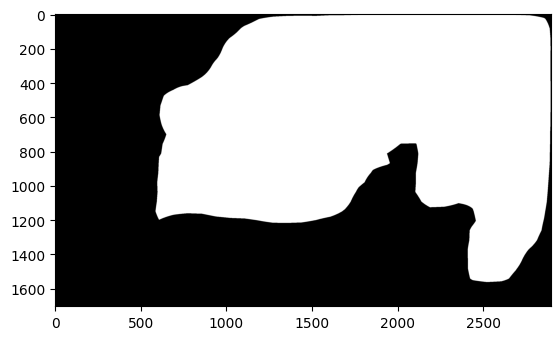

In [15]:
# Let's plot the mask for the `person` class since the 0th mask belongs to `person`
plt.imshow(masks[0], cmap='gray')
plt.show()

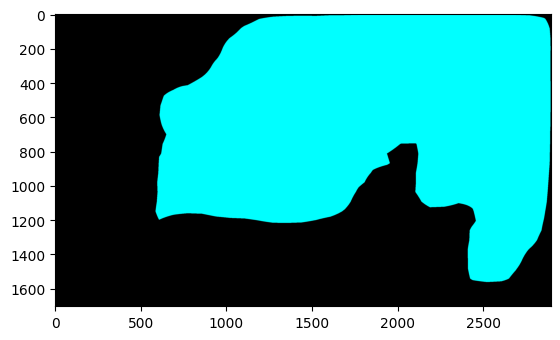

In [16]:
# Let's color the `person` mask using the `random_colour_masks` function
mask1 = random_colour_masks(masks[0])
plt.imshow(mask1)
plt.show()

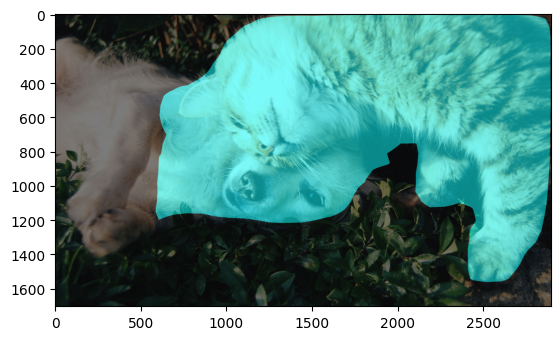

In [17]:
# Let's blend the original and the masked image and plot it.
blend_img = cv2.addWeighted(np.asarray(img), 0.5, mask1, 0.5, 0)

plt.imshow(blend_img)
plt.show()

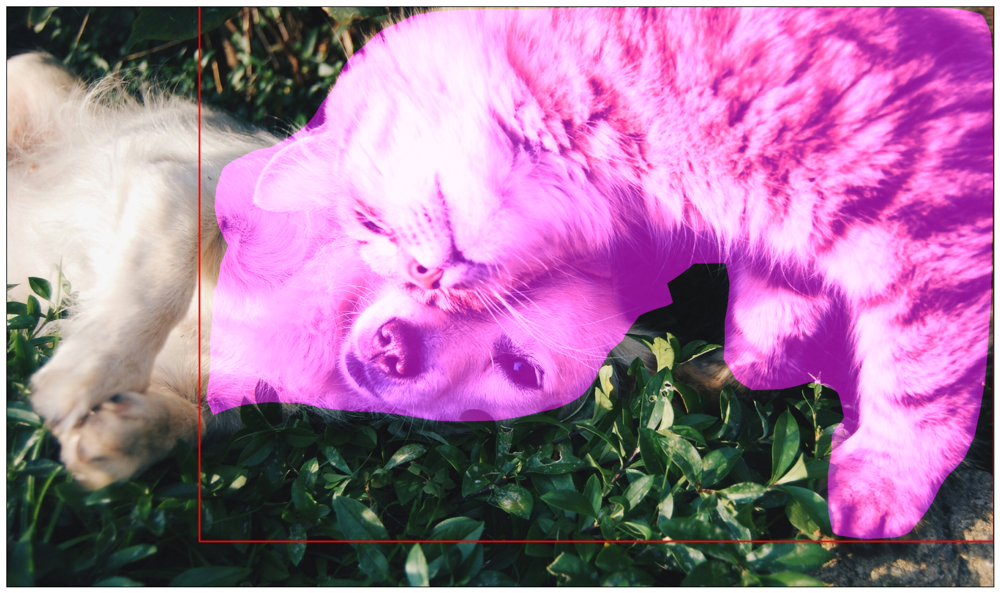

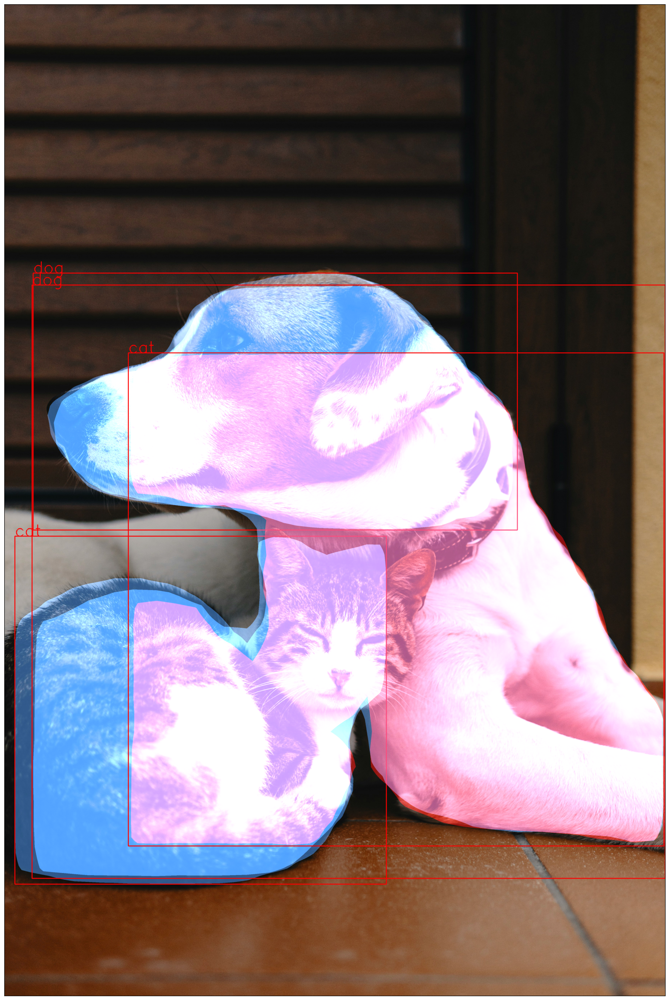

: 

In [32]:
for img_path in img_paths:
    instance_segmentation_api(img_path, 0.6)